# STANDARD Method with Celltypist - QUERY DATASET: GSE242423

We performed analysis following three scenarions:
1. scGPT reference mapping
2. scGPT finetuned with GSE242423 dataset
3. standard method
    1. **standard method with celltypist only <---- YOU ARE HERE**
    2. with celltypist + scANVI

# Description
- we performed cell type annotation prediction using the labels from GSE242423:
    - Extreme OSK (xOSK)    
    - Fibroblast            
    - Fibroblast-like      
    - High OSK (hOSK)        
    - Intermediate         
    - Keratinocyte-like     
    - Partial                
    - Pre-iPSC              
    - iPSC

# Objective
- In this jupyter notebook we only perform cell type annotation using celltypist on the validation dataset, which contains 30% of the GSE242423.
- We calculate evaluation metrics (NMI, ARI, Accuracy, Confusion matrix) using SCIB first, and SKLEARN later.
- The main difference between this one and the other file is that here we are using SCVI and SCANVI for semi-supervised learning transfer and labeling

# Import libraries

In [1]:
import celltypist
import scanpy as sc
import os
import pandas as pd
import scib
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scvi
from collections import Counter
import anndata
from celltypist import models
from sklearn.model_selection import train_test_split
from sklearn.metrics import adjusted_rand_score, accuracy_score, normalized_mutual_info_score

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/lightning_fabric/plugins/environments/xla.py:18: DeprecationWarning: `ModuleAvailableCache` is a special case of `RequirementCache`. Please use `RequirementCache(module=...)` instead.
  from lightning_fabric.accelerators.tpu import _XLA_AVAILABLE, TPUAccelerator
/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/lightning_fabric/__init__.py:29: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('lightning_fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  __import__("pkg_resources").declare_namespace(__name__)
/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/pytorch_lightning/__init__.py:45: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('pytorch_ligh

# Load reprogramming reference dataset GSE242423

In [51]:
# Load your data (assuming it's in AnnData format)
ref_adata = anndata.read_h5ad("../../REPROGRAMMING_DATASETS/RAW_labeled_reprogramming_reference_data.h5ad")
# filtering genes
sc.pp.filter_genes(ref_adata, min_cells = 10)

In [60]:
sc.pp.normalize_total(ref_adata, target_sum = 1e4) #Note this is only for cell annotation, recommended by authors but not best
sc.pp.log1p(ref_adata)

In [55]:
ref_adata = anndata.read_h5ad("scVI_GSE242423_adata_unintigrated.h5ad")
sc.pp.filter_genes(ref_adata, min_cells = 10)

# Prepare gene names as Index for GSE242423

In [56]:
ref_adata.obs.groupby('celltype').size()

/tmp/ipykernel_3431/2047421997.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ref_adata.obs.groupby('celltype').size()


celltype
Extreme OSK (xOSK)     1707
Fibroblast            11041
Fibroblast-like       16916
High OSK (hOSK)         523
Intermediate          12271
Keratinocyte-like       934
Partial                4445
Pre-iPSC               8416
iPSC                   3125
dtype: int64

In [52]:
ref_adata.obs.groupby('celltype').size()

/tmp/ipykernel_3431/2047421997.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ref_adata.obs.groupby('celltype').size()


celltype
Extreme OSK (xOSK)     1707
Fibroblast            11041
Fibroblast-like       16916
High OSK (hOSK)         523
Intermediate          12271
Keratinocyte-like       934
Partial                4445
Pre-iPSC               8416
iPSC                   3125
dtype: int64

# Divide dataset in training (70%) and validation (30%)

In [61]:
# Get cell indices for stratified split
cell_indices = np.arange(ref_adata.n_obs)
train_indices, val_indices = train_test_split(
    cell_indices, 
    test_size=0.3, 
    stratify=ref_adata.obs['celltype'], 
    random_state=42
)


# Create train and validation AnnData objects
train_adata = ref_adata[train_indices]
query_adata = ref_adata[val_indices]


In [62]:
# Train the model on the training set
train_model = celltypist.train(train_adata, labels='celltype', n_jobs=22,
                               use_SGD=False,
                               feature_selection=True, top_genes=300)

🍳 Preparing data before training
🔬 Input data has 41564 cells and 25039 genes
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
🔎 Selecting features
🧬 1611 features are selected
🏋️ Starting the second round of training
🏋️ Training data using logistic regression
/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
✅ Model training done!


# Use Cell typist to predict cell type annotation

In [63]:
# Use the trained model to predict cell types on the validation set
val_predictions = celltypist.annotate(query_adata, model=train_model)


🔬 Input data has 17814 cells and 25039 genes
🔗 Matching reference genes in the model
🧬 1611 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


# Save train model (to not train again) 

In [64]:
train_model.write('FINAL_reprogramming_GSE242423_2024-08-16.pkl')

In [9]:
train_model = models.Model.load('FINAL_reprogramming_GSE242423_2024-08-16.pkl')

# Analyze cell distribution in validation set by batch

In [13]:
query_adata.obs

,nCount_RNA,nFeature_RNA,sample,percent.mt,percent.oskm,cluster,umap1,umap2,barcode_sample,celltype,n_genes
35512,20254,4053,D10,7.134393,0.162931,11,-5.458760,4.994076,CTACTATAGGTACTGG-6,Intermediate,4053
29161,8238,2840,D8,4.357854,0.000000,3,2.960594,-8.385924,GTAGGTTGTCACGACC-5,Fibroblast-like,2840
2824,15194,4043,D0,5.811505,0.000000,1,-0.456594,-13.355161,CAGTTAGGTGTTCATG-1,Fibroblast,4043
27419,28379,5575,D8,10.750907,0.165615,11,-3.738778,5.393459,CCGGACACAGAGTCAG-5,Intermediate,5575
40845,8950,2782,D10,7.977654,0.156425,12,-1.691119,9.192800,TTAGGGTGTCATTCCC-6,Intermediate,2782
...,...,...,...,...,...,...,...,...,...,...,...
53395,12663,3547,D14,13.322278,0.165837,14,1.374322,10.690220,GGTAGAGGTATTTCGG-8,Pre-iPSC,3547
49095,21230,4352,D14,2.378709,0.254357,14,-2.798934,8.966746,AATGGAACACCCTCTA-8,Pre-iPSC,4352
49417,21140,4571,D14,7.928098,0.160833,14,3.760862,11.958642,ACTACGATCCCATACC-8,Pre-iPSC,4571
50904,9998,3074,D14,6.401280,0.080016,10,-0.470307,0.735737,CATAGACGTCTGTAGT-8,Partial,3074


In [16]:
query_adata.obs.groupby('celltype').size()

/tmp/ipykernel_92778/1989358497.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  query_adata.obs.groupby('celltype').size()


celltype
Extreme OSK (xOSK)     512
Fibroblast            3312
Fibroblast-like       5075
High OSK (hOSK)        157
Intermediate          3681
Keratinocyte-like      280
Partial               1334
Pre-iPSC              2525
iPSC                   938
dtype: int64

In [19]:
evaluation_results

{'NMI_cluster/label': 0.6824624098693085,
 'ARI_cluster/label': 0.586286549040496,
 'ASW_label': 0.56748178283009,
 'ASW_label/batch': 0.8716335072253254,
 'PCR_batch': 0.0,
 'graph_conn': 0.9527971094681931,
 'avg_bio': 0.6120769139132981}

# Using SKLEARN to evaluate metrics (ARI, NMI, Accuracy)

In [65]:
# Extract the predicted labels and ensure they are 1D
predicted_labels = val_predictions.predicted_labels.values.flatten()
# Calculate metrics
ari = adjusted_rand_score(query_adata.obs['celltype'], predicted_labels)
accuracy = accuracy_score(query_adata.obs['celltype'], predicted_labels)
nmi = normalized_mutual_info_score(query_adata.obs['celltype'], predicted_labels)

print(f"Adjusted Rand Index: {ari:.4f}")
print(f"Accuracy: {accuracy:.4f}")
print(f"Normalized Mutual Information: {nmi:.4f}")

Adjusted Rand Index: 0.8813
Accuracy: 0.9393
Normalized Mutual Information: 0.8409


# Data visualization

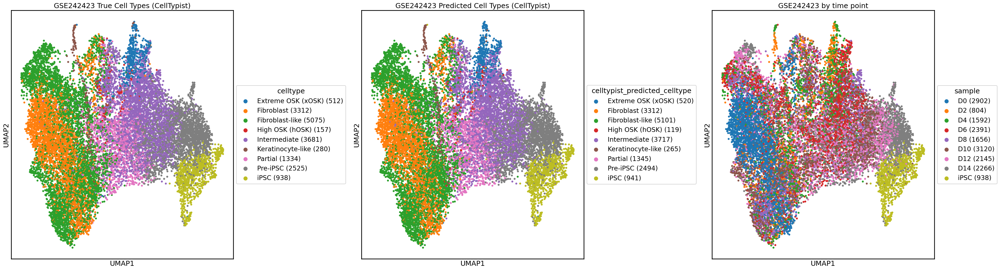

In [89]:
import scanpy as sc
import matplotlib.pyplot as plt

# Add predicted labels to the validation AnnData object
max_prob_scores = val_predictions.probability_matrix.max(axis=1)
query_adata.obs['celltypist_predicted_celltype'] = val_predictions.predicted_labels
query_adata.obs['celltypist_predicted_score'] = max_prob_scores.values

# Compute UMAP if not already computedzs
sc.pp.neighbors(query_adata, use_rep="X_scVI")
sc.tl.umap(query_adata)

# Function to plot UMAP with cell counts in legend
def plot_umap_with_counts(adata, ax, color_key, title):
    sc.pl.umap(adata, color=color_key, ax=ax, show=False, s = 100, title=title)
    
    # Get the current legend handles and labels
    handles, labels = ax.get_legend_handles_labels()
    
    # Count cells for each type
    cell_counts = adata.obs[color_key].value_counts()
    
    # Create new labels with counts
    new_labels = [f"{label} ({cell_counts[label]})" for label in labels]
    
    # Create a new legend with counts
    ax.legend(handles, new_labels, title=color_key, loc='center left', bbox_to_anchor=(1, 0.5))

# Create a figure with two subplots side by side
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(36, 10))

# Plot true cell types
plot_umap_with_counts(query_adata, ax1, 'celltype', 'GSE242423 True Cell Types (CellTypist)')

# Plot predicted cell types
plot_umap_with_counts(query_adata, ax2, 'celltypist_predicted_celltype', 'GSE242423 Predicted Cell Types (CellTypist)')

# Plot true cell types
plot_umap_with_counts(query_adata, ax3, 'sample', 'GSE242423 by time point')

# Adjust layout and display
plt.tight_layout()
plt.show()

/tmp/ipykernel_3431/546278859.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('tab20')  # You can change this to any colormap you prefer
/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Try

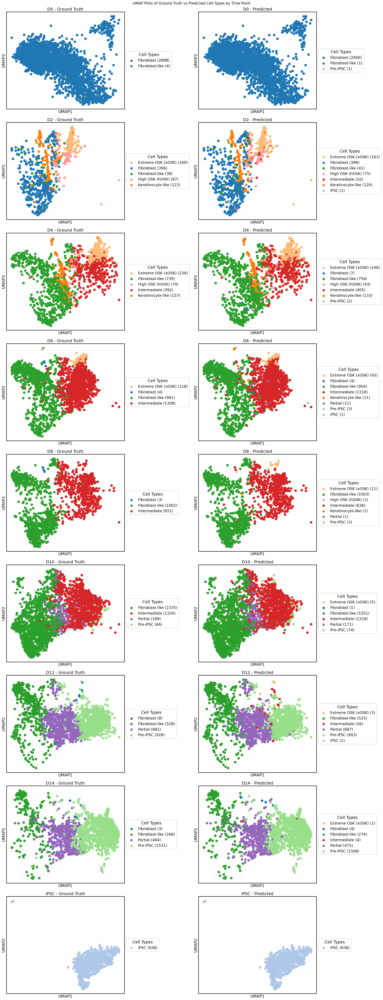

In [70]:
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Ensure UMAP coordinates are computed
sc.pp.neighbors(query_adata, use_rep="X_scVI")
sc.tl.umap(query_adata)

# Specify the desired order of time points
desired_order = ['D0', 'D2', 'D4', 'D6', 'D8', 'D10', 'D12', 'D14', 'iPSC']

# Filter and sort time points based on the desired order
time_points = [tp for tp in desired_order if tp in query_adata.obs['sample'].unique()]
n_time_points = len(time_points)

# Calculate grid dimensions
n_cols = 2
n_rows = n_time_points  # One row per time point

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12*n_cols, 7*n_rows))

# Get unique cell types from both 'celltype' and 'celltypist_predicted_celltype'
all_cell_types = set(query_adata.obs['celltype'].unique()) | set(query_adata.obs['celltypist_predicted_celltype'].unique())

# Create a color map
n_colors = len(all_cell_types)
color_map = plt.cm.get_cmap('tab20')  # You can change this to any colormap you prefer
colors = [mcolors.rgb2hex(color_map(i)) for i in range(n_colors)]
color_dict = dict(zip(all_cell_types, colors))

# Plot UMAP for each time point
for i, time_point in enumerate(time_points):
    time_point_data = query_adata[query_adata.obs['sample'] == time_point]
    
    # Plot celltype in the first column
    ax = axes[i, 0]
    sc.pl.umap(time_point_data, color='celltype', palette=color_dict, frameon=True, show=False, s=500, ax=ax, title=f"{time_point} - Ground Truth")
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")
    
    # Add a frame around the subplot
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2)
        spine.set_edgecolor('black')
    
    # Modify legend to include cell counts
    handles, labels = ax.get_legend_handles_labels()
    cell_counts = time_point_data.obs['celltype'].value_counts()
    new_labels = [f"{label} ({cell_counts.get(label, 0)})" for label in labels]
    ax.legend(handles, new_labels, title="Cell Types", loc='center left', bbox_to_anchor=(1, 0.5))
    
    # Plot celltypist_predicted_celltype in the second column
    ax = axes[i, 1]
    sc.pl.umap(time_point_data, color='celltypist_predicted_celltype', palette=color_dict, frameon=True, show=False, s=500, ax=ax, title=f"{time_point} - Predicted")
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")
    
    # Add a frame around the subplot
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2)
        spine.set_edgecolor('black')
    
    # Modify legend to include cell counts
    handles, labels = ax.get_legend_handles_labels()
    cell_counts = time_point_data.obs['celltypist_predicted_celltype'].value_counts()
    new_labels = [f"{label} ({cell_counts.get(label, 0)})" for label in labels]
    ax.legend(handles, new_labels, title="Cell Types", loc='center left', bbox_to_anchor=(1, 0.5))

# Add a main title
fig.suptitle("UMAP Plots of Ground Truth vs Predicted Cell Types by Time Point", fontsize=16)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(top=0.97)  # Adjust for main title
plt.show()

# Uncomment the following line to save the figure
# plt.savefig('umap/umap_cell_types_comparison.png', dpi=300, bbox_inches='tight')

In [28]:
query_adata.obs.groupby('sample').size()

/tmp/ipykernel_92778/1659724899.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  query_adata.obs.groupby('sample').size()


sample
D0      2902
D2       804
D4      1592
D6      2391
D8      1656
D10     3120
D12     2145
D14     2266
iPSC     938
dtype: int64

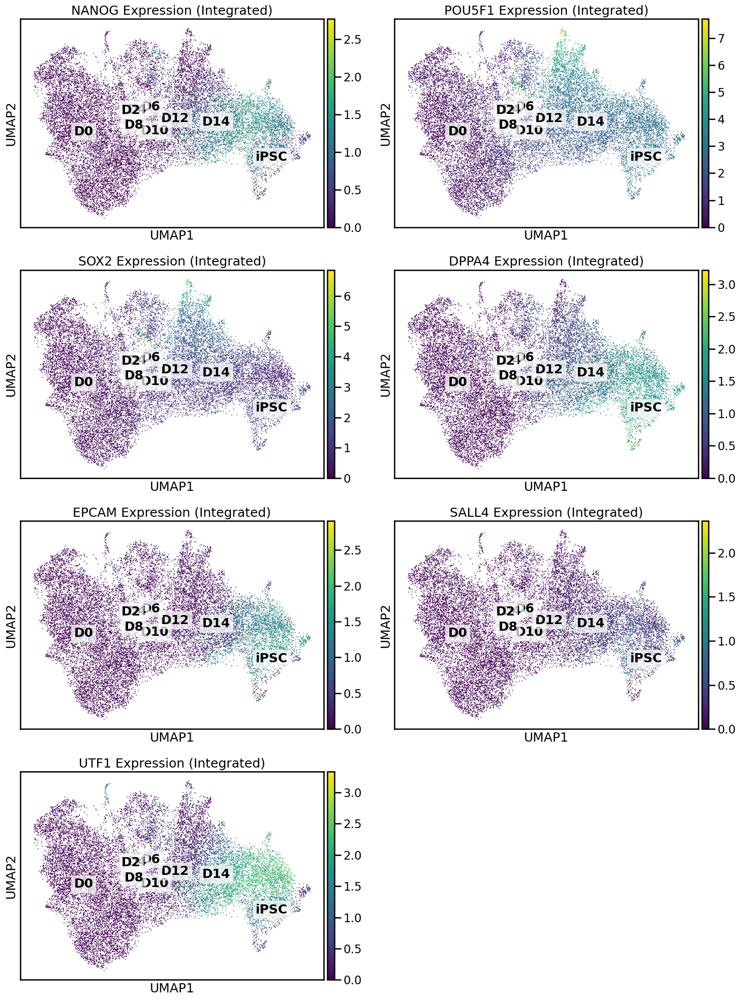


NANOG Expression Summary:
D10: Mean expression = 0.3624
D8: Mean expression = 0.1480
D0: Mean expression = 0.0007
D14: Mean expression = 0.9475
D12: Mean expression = 0.6639
D6: Mean expression = 0.1463
D4: Mean expression = 0.0274
iPSC: Mean expression = 0.7087
D2: Mean expression = 0.0024

POU5F1 Expression Summary:
D10: Mean expression = 1.3145
D8: Mean expression = 1.4421
D0: Mean expression = 0.0007
D14: Mean expression = 2.1255
D12: Mean expression = 1.6428
D6: Mean expression = 1.8768
D4: Mean expression = 1.8248
iPSC: Mean expression = 2.8402
D2: Mean expression = 2.5777

SOX2 Expression Summary:
D10: Mean expression = 0.5715
D8: Mean expression = 0.9394
D0: Mean expression = 0.0002
D14: Mean expression = 0.7025
D12: Mean expression = 0.6203
D6: Mean expression = 1.0503
D4: Mean expression = 1.0719
iPSC: Mean expression = 1.1975
D2: Mean expression = 1.8248

DPPA4 Expression Summary:
D10: Mean expression = 0.4174
D8: Mean expression = 0.2937
D0: Mean expression = 0.0045
D14: M

In [80]:

# Compute UMAP on integrated data
sc.pp.neighbors(query_adata, use_rep="X_scVI")
sc.tl.umap(query_adata)

# Plot UMAP
markers = ['NANOG', 'POU5F1', 'SOX2', 'DPPA4', 'EPCAM', 'SALL4', 'UTF1']

fig, axs = plt.subplots(4, 2, figsize=(15, 20))
axs = axs.flatten()

for i, gene in enumerate(markers):
    if gene in query_adata.var_names:
        sc.pl.umap(query_adata, 
                   color=gene, 
                   title=f'{gene} Expression (Integrated)',
                   ax=axs[i],
                   show=False)
        
        # Add text annotations for each time point
        for time_point in query_adata.obs['sample'].unique():
            subset = query_adata[query_adata.obs['sample'] == time_point]
            centroid = subset.obsm['X_umap'].mean(axis=0)
            axs[i].text(centroid[0], centroid[1], time_point, 
                    fontweight='bold', ha='center', va='center', 
                    bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    else:
        axs[i].text(0.5, 0.5, f"{gene} not found", ha='center', va='center')
        axs[i].axis('off')

# Remove the last empty subplot
fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()

# Print summary statistics for each gene marker
for gene in markers:
    if gene in query_adata.var_names:
        print(f"\n{gene} Expression Summary:")
        for time_point in query_adata.obs['sample'].unique():
            subset = query_adata[query_adata.obs['sample'] == time_point]
            mean_expr = subset[:, gene].X.mean()
            print(f"{time_point}: Mean expression = {mean_expr:.4f}")
    else:
        print(f"\n{gene} not found in the dataset")

In [34]:
query_adata

AnnData object with n_obs × n_vars = 17814 × 25039
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'percent.mt', 'percent.oskm', 'umap1', 'umap2', 'barcode_sample', 'celltype', 'predicted_celltype', 'cluster', 'celltypist_predicted_celltype', 'celltypist_predicted_score'
    var: 'n_cells'
    uns: 'log1p', 'pca', 'neighbors', 'cluster', 'umap', 'celltype_colors', 'predicted_celltype_colors', 'celltypist_predicted_celltype_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

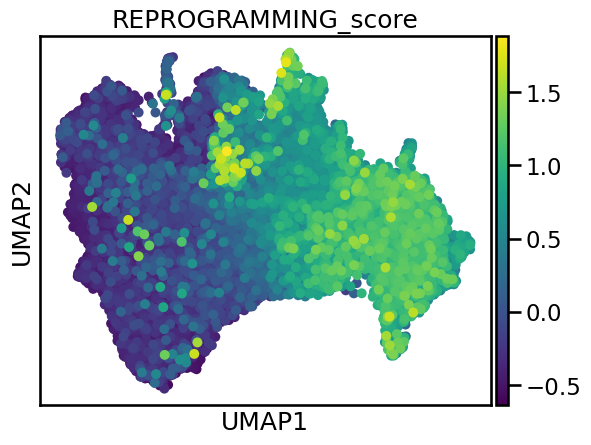

In [81]:
markers = ['NANOG', 'POU5F1', 'SOX2', 'DPPA4', 'EPCAM', 'SALL4', 'UTF1']
sc.pp.neighbors(query_adata, use_rep = 'X_scVI')
sc.tl.leiden(query_adata, resolution = 6, key_added = 'overcluster')
sc.tl.score_genes(query_adata, markers, score_name = 'REPROGRAMMING_score')
sc.pl.umap(query_adata, color = ['REPROGRAMMING_score'], s = 205)

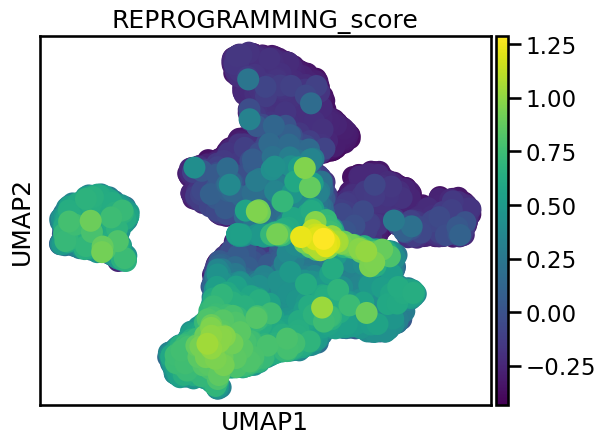

In [45]:
reprogrammed_cell_markers = ['NANOG', 'SOX2', 'KLF4', 'DPPA4', 'EPCAM', 'KRT14', 'SALL4', 'UTF1', 'DPPA5A', 'ZFP42', 'ESRRB']
sc.pp.neighbors(query_adata, use_rep = 'X_umap')
sc.tl.leiden(query_adata, resolution = 3, key_added = 'overcluster')
sc.tl.score_genes(query_adata, reprogrammed_cell_markers, score_name = 'REPROGRAMMING_score')
sc.pl.umap(query_adata, color = ['REPROGRAMMING_score'], s = 1005)

# scVI integration

# Preparing merged adata object

In [48]:
query_adata.obs['celltype'] = 'Unknown'
query_adata.obs['batch'] = query_adata.obs['sample']
query_adata.obs['sample'] = query_adata.obs.index
ref_adata.obs['batch'] = 'ref'
ref_adata.obs['sample'] = ref_adata.obs.index.map(lambda x: x.split(':')[0])
print("REF var_names:", ref_adata.var_names[:5])
print("QUERY var_names:", query_adata.var_names[:5])

/tmp/ipykernel_92778/3484622066.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  query_adata.obs['celltype'] = 'Unknown'


REF var_names: Index(['AL627309.1', 'AL627309.5', 'AL627309.4', 'LINC01409', 'FAM87B'], dtype='object')
QUERY var_names: Index(['AL627309.1', 'AL627309.5', 'AL627309.4', 'LINC01409', 'FAM87B'], dtype='object')


In [49]:
query_adata.obs

,nCount_RNA,nFeature_RNA,sample,percent.mt,percent.oskm,cluster,umap1,umap2,barcode_sample,celltype,n_genes,batch
35512,20254,4053,35512,7.134393,0.162931,11,-5.458760,4.994076,CTACTATAGGTACTGG-6,Unknown,4053,D10
29161,8238,2840,29161,4.357854,0.000000,3,2.960594,-8.385924,GTAGGTTGTCACGACC-5,Unknown,2840,D8
2824,15194,4043,2824,5.811505,0.000000,1,-0.456594,-13.355161,CAGTTAGGTGTTCATG-1,Unknown,4043,D0
27419,28379,5575,27419,10.750907,0.165615,11,-3.738778,5.393459,CCGGACACAGAGTCAG-5,Unknown,5575,D8
40845,8950,2782,40845,7.977654,0.156425,12,-1.691119,9.192800,TTAGGGTGTCATTCCC-6,Unknown,2782,D10
...,...,...,...,...,...,...,...,...,...,...,...,...
53395,12663,3547,53395,13.322278,0.165837,14,1.374322,10.690220,GGTAGAGGTATTTCGG-8,Unknown,3547,D14
49095,21230,4352,49095,2.378709,0.254357,14,-2.798934,8.966746,AATGGAACACCCTCTA-8,Unknown,4352,D14
49417,21140,4571,49417,7.928098,0.160833,14,3.760862,11.958642,ACTACGATCCCATACC-8,Unknown,4571,D14
50904,9998,3074,50904,6.401280,0.080016,10,-0.470307,0.735737,CATAGACGTCTGTAGT-8,Unknown,3074,D14


In [50]:
merged_adata = sc.concat((query_adata, ref_adata))

/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [53]:
merged_adata.obs.percent.mt

AttributeError: 'DataFrame' object has no attribute 'percent'

# CHECK HEREEEEE 

In [53]:
ref_adata = anndata.read_h5ad("../../REPROGRAMMING_DATASETS/RAW_labeled_reprogramming_reference_data.h5ad")
# filtering genes
sc.pp.filter_genes(ref_adata, min_cells = 10)


import torch
torch.set_float32_matmul_precision('high')

import scipy.sparse as sp
if sp.issparse(ref_adata.X):
    ref_adata.X = ref_adata.X.tocsr()

scvi.model.SCVI.setup_anndata(ref_adata, batch_key='sample')
vae = scvi.model.SCVI(ref_adata)
vae.train()


#lvae = scvi.model.SCANVI.from_scvi_model(vae, adata = merged_adata, unlabeled_category = 'Unknown', labels_key = 'celltype')

#lvae.train(max_epochs=20, n_samples_per_label=100)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 2/135:   1%|▌                                                                               | 1/135 [00:07<15:52,  7.11s/it, loss=1.05e+04, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 3/135:   1%|█▏                                                                              | 2/135 [00:13<14:58,  6.76s/it, loss=1.03e+04, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 4/135:   2%|█▊                                                                              | 3/135 [00:20<14:48,  6.73s/it, loss=9.97e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 5/135:   3%|██▍                                                                                | 4/135 [00:27<14:56,  6.84s/it, loss=1e+04, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 6/135:   4%|███                                                                              | 5/135 [00:34<15:02,  6.94s/it, loss=9.8e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 7/135:   4%|███▌                                                                            | 6/135 [00:41<15:09,  7.05s/it, loss=9.77e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 8/135:   5%|████▏                                                                           | 7/135 [00:49<15:14,  7.15s/it, loss=9.85e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 9/135:   6%|████▋                                                                           | 8/135 [00:56<15:16,  7.22s/it, loss=9.84e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 10/135:   7%|█████▎                                                                         | 9/135 [01:03<14:52,  7.08s/it, loss=9.72e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 11/135:   7%|█████▊                                                                        | 10/135 [01:09<14:25,  6.92s/it, loss=9.69e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 12/135:   8%|██████▍                                                                        | 11/135 [01:16<14:23,  6.97s/it, loss=9.6e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 13/135:   9%|██████▉                                                                       | 12/135 [01:23<14:12,  6.93s/it, loss=9.77e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 14/135:  10%|███████▌                                                                       | 13/135 [01:29<13:06,  6.45s/it, loss=9.7e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 15/135:  10%|████████                                                                      | 14/135 [01:34<12:12,  6.05s/it, loss=9.64e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 16/135:  11%|████████▋                                                                     | 15/135 [01:39<11:49,  5.91s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 17/135:  12%|█████████▏                                                                    | 16/135 [01:46<12:11,  6.14s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 18/135:  13%|█████████▊                                                                    | 17/135 [01:51<11:41,  5.94s/it, loss=9.64e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 19/135:  13%|██████████▍                                                                   | 18/135 [01:58<11:58,  6.15s/it, loss=9.65e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 20/135:  14%|██████████▉                                                                   | 19/135 [02:05<12:22,  6.40s/it, loss=9.71e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 21/135:  15%|███████████▌                                                                  | 20/135 [02:11<12:02,  6.28s/it, loss=9.67e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 22/135:  16%|████████████▏                                                                 | 21/135 [02:17<11:29,  6.05s/it, loss=9.73e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 23/135:  16%|████████████▋                                                                 | 22/135 [02:24<11:55,  6.33s/it, loss=9.66e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 24/135:  17%|█████████████▍                                                                 | 23/135 [02:31<12:17,  6.58s/it, loss=9.6e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 25/135:  18%|█████████████▊                                                                | 24/135 [02:38<12:31,  6.77s/it, loss=9.69e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 26/135:  19%|██████████████▍                                                               | 25/135 [02:45<12:34,  6.86s/it, loss=9.68e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 27/135:  19%|███████████████                                                               | 26/135 [02:52<12:39,  6.97s/it, loss=9.66e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 28/135:  20%|███████████████▌                                                              | 27/135 [02:59<12:17,  6.83s/it, loss=9.69e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 29/135:  21%|████████████████▏                                                             | 28/135 [03:05<12:00,  6.73s/it, loss=9.48e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 30/135:  21%|████████████████▊                                                             | 29/135 [03:12<11:57,  6.77s/it, loss=9.58e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 31/135:  22%|█████████████████▎                                                            | 30/135 [03:19<11:58,  6.84s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 32/135:  23%|█████████████████▉                                                            | 31/135 [03:25<11:28,  6.62s/it, loss=9.68e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 33/135:  24%|██████████████████▍                                                           | 32/135 [03:31<10:49,  6.30s/it, loss=9.58e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 34/135:  24%|███████████████████▎                                                           | 33/135 [03:36<10:15,  6.03s/it, loss=9.5e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 35/135:  25%|███████████████████▋                                                          | 34/135 [03:41<09:47,  5.82s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 36/135:  26%|████████████████████▏                                                         | 35/135 [03:47<09:29,  5.70s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 37/135:  27%|████████████████████▊                                                         | 36/135 [03:52<09:16,  5.62s/it, loss=9.61e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 38/135:  27%|█████████████████████▍                                                        | 37/135 [03:59<09:30,  5.82s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 39/135:  28%|█████████████████████▉                                                        | 38/135 [04:06<09:56,  6.15s/it, loss=9.65e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 40/135:  29%|██████████████████████▌                                                       | 39/135 [04:12<10:11,  6.37s/it, loss=9.59e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 41/135:  30%|███████████████████████                                                       | 40/135 [04:18<09:44,  6.15s/it, loss=9.64e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 42/135:  30%|███████████████████████▋                                                      | 41/135 [04:23<09:12,  5.88s/it, loss=9.67e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 43/135:  31%|████████████████████████▎                                                     | 42/135 [04:29<08:50,  5.70s/it, loss=9.67e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 44/135:  32%|████████████████████████▊                                                     | 43/135 [04:34<08:32,  5.57s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 45/135:  33%|█████████████████████████▍                                                    | 44/135 [04:41<09:06,  6.00s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 46/135:  33%|██████████████████████████                                                    | 45/135 [04:48<09:28,  6.32s/it, loss=9.58e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 47/135:  34%|██████████████████████████▌                                                   | 46/135 [04:55<09:40,  6.52s/it, loss=9.66e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 48/135:  35%|███████████████████████████▏                                                  | 47/135 [05:02<09:37,  6.56s/it, loss=9.52e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 49/135:  36%|███████████████████████████▋                                                  | 48/135 [05:07<09:01,  6.23s/it, loss=9.56e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 50/135:  36%|████████████████████████████▎                                                 | 49/135 [05:12<08:30,  5.94s/it, loss=9.64e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 51/135:  37%|████████████████████████████▉                                                 | 50/135 [05:18<08:09,  5.76s/it, loss=9.62e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 52/135:  38%|█████████████████████████████▍                                                | 51/135 [05:23<07:51,  5.62s/it, loss=9.66e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 53/135:  39%|██████████████████████████████                                                | 52/135 [05:28<07:39,  5.54s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 54/135:  39%|██████████████████████████████▌                                               | 53/135 [05:34<07:29,  5.49s/it, loss=9.67e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 55/135:  40%|███████████████████████████████▏                                              | 54/135 [05:40<07:45,  5.75s/it, loss=9.61e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 56/135:  41%|███████████████████████████████▊                                              | 55/135 [05:46<07:51,  5.89s/it, loss=9.62e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 57/135:  41%|████████████████████████████████▎                                             | 56/135 [05:51<07:30,  5.70s/it, loss=9.59e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 58/135:  42%|████████████████████████████████▉                                             | 57/135 [05:58<07:46,  5.98s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 59/135:  43%|█████████████████████████████████▌                                            | 58/135 [06:04<07:31,  5.86s/it, loss=9.56e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 60/135:  44%|██████████████████████████████████                                            | 59/135 [06:09<07:22,  5.82s/it, loss=9.64e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 61/135:  44%|██████████████████████████████████▋                                           | 60/135 [06:15<07:03,  5.64s/it, loss=9.65e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 62/135:  45%|███████████████████████████████████▋                                           | 61/135 [06:20<06:58,  5.65s/it, loss=9.6e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 63/135:  46%|███████████████████████████████████▊                                          | 62/135 [06:26<06:44,  5.54s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 64/135:  47%|████████████████████████████████████▍                                         | 63/135 [06:31<06:32,  5.45s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 65/135:  47%|████████████████████████████████████▉                                         | 64/135 [06:36<06:22,  5.39s/it, loss=9.55e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 66/135:  48%|█████████████████████████████████████▌                                        | 65/135 [06:41<06:15,  5.36s/it, loss=9.52e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 67/135:  49%|██████████████████████████████████████▏                                       | 66/135 [06:47<06:09,  5.36s/it, loss=9.56e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 68/135:  50%|██████████████████████████████████████▋                                       | 67/135 [06:52<06:04,  5.36s/it, loss=9.56e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 69/135:  50%|███████████████████████████████████████▎                                      | 68/135 [06:57<05:58,  5.34s/it, loss=9.52e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 70/135:  51%|███████████████████████████████████████▊                                      | 69/135 [07:03<05:50,  5.30s/it, loss=9.69e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 71/135:  52%|████████████████████████████████████████▍                                     | 70/135 [07:08<05:43,  5.29s/it, loss=9.56e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 72/135:  53%|█████████████████████████████████████████▌                                     | 71/135 [07:14<05:48,  5.45s/it, loss=9.7e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 73/135:  53%|█████████████████████████████████████████▌                                    | 72/135 [07:19<05:48,  5.53s/it, loss=9.58e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 74/135:  54%|██████████████████████████████████████████▏                                   | 73/135 [07:27<06:13,  6.03s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 75/135:  55%|██████████████████████████████████████████▊                                   | 74/135 [07:34<06:29,  6.38s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 76/135:  56%|███████████████████████████████████████████▎                                  | 75/135 [07:41<06:32,  6.55s/it, loss=9.64e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 77/135:  56%|███████████████████████████████████████████▉                                  | 76/135 [07:48<06:32,  6.65s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 78/135:  57%|████████████████████████████████████████████▍                                 | 77/135 [07:55<06:30,  6.73s/it, loss=9.64e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 79/135:  58%|█████████████████████████████████████████████                                 | 78/135 [08:02<06:29,  6.83s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 80/135:  59%|█████████████████████████████████████████████▋                                | 79/135 [08:08<06:20,  6.80s/it, loss=9.54e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 81/135:  59%|██████████████████████████████████████████████▏                               | 80/135 [08:15<06:14,  6.80s/it, loss=9.51e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 82/135:  60%|██████████████████████████████████████████████▊                               | 81/135 [08:22<06:00,  6.68s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 83/135:  61%|███████████████████████████████████████████████▍                              | 82/135 [08:28<05:49,  6.59s/it, loss=9.51e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 84/135:  61%|███████████████████████████████████████████████▉                              | 83/135 [08:33<05:24,  6.25s/it, loss=9.54e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 85/135:  62%|█████████████████████████████████████████████████▏                             | 84/135 [08:39<05:03,  5.96s/it, loss=9.6e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 86/135:  63%|█████████████████████████████████████████████████                             | 85/135 [08:44<04:50,  5.82s/it, loss=9.55e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 87/135:  64%|█████████████████████████████████████████████████▋                            | 86/135 [08:50<04:49,  5.91s/it, loss=9.52e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 88/135:  64%|██████████████████████████████████████████████████▎                           | 87/135 [08:57<04:57,  6.19s/it, loss=9.52e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 89/135:  65%|██████████████████████████████████████████████████▊                           | 88/135 [09:03<04:53,  6.24s/it, loss=9.65e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 90/135:  66%|███████████████████████████████████████████████████▍                          | 89/135 [09:10<04:47,  6.26s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 91/135:  67%|████████████████████████████████████████████████████                          | 90/135 [09:17<04:48,  6.41s/it, loss=9.58e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 92/135:  67%|████████████████████████████████████████████████████▌                         | 91/135 [09:23<04:47,  6.54s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 93/135:  68%|█████████████████████████████████████████████████████▏                        | 92/135 [09:30<04:47,  6.68s/it, loss=9.54e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 94/135:  69%|█████████████████████████████████████████████████████▋                        | 93/135 [09:37<04:43,  6.76s/it, loss=9.61e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 95/135:  70%|██████████████████████████████████████████████████████▎                       | 94/135 [09:44<04:40,  6.85s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 96/135:  70%|██████████████████████████████████████████████████████▉                       | 95/135 [09:51<04:33,  6.84s/it, loss=9.66e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 97/135:  71%|███████████████████████████████████████████████████████▍                      | 96/135 [09:58<04:22,  6.74s/it, loss=9.56e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 98/135:  72%|████████████████████████████████████████████████████████                      | 97/135 [10:03<03:59,  6.29s/it, loss=9.63e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 99/135:  73%|████████████████████████████████████████████████████████▌                     | 98/135 [10:08<03:40,  5.95s/it, loss=9.62e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 100/135:  73%|████████████████████████████████████████████████████████▍                    | 99/135 [10:13<03:27,  5.75s/it, loss=9.61e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 101/135:  74%|████████████████████████████████████████████████████████▎                   | 100/135 [10:19<03:16,  5.61s/it, loss=9.61e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 102/135:  75%|████████████████████████████████████████████████████████▊                   | 101/135 [10:25<03:22,  5.96s/it, loss=9.76e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 103/135:  76%|██████████████████████████████████████████████████████████▏                  | 102/135 [10:32<03:20,  6.08s/it, loss=9.7e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 104/135:  76%|█████████████████████████████████████████████████████████▉                  | 103/135 [10:37<03:07,  5.86s/it, loss=9.62e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 105/135:  77%|██████████████████████████████████████████████████████████▌                 | 104/135 [10:42<02:56,  5.69s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 106/135:  78%|███████████████████████████████████████████████████████████                 | 105/135 [10:49<02:56,  5.89s/it, loss=9.65e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 107/135:  79%|███████████████████████████████████████████████████████████▋                | 106/135 [10:56<02:58,  6.15s/it, loss=9.53e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 108/135:  79%|█████████████████████████████████████████████████████████████                | 107/135 [11:02<02:58,  6.38s/it, loss=9.6e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 109/135:  80%|████████████████████████████████████████████████████████████▊               | 108/135 [11:08<02:44,  6.09s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 110/135:  81%|█████████████████████████████████████████████████████████████▎              | 109/135 [11:14<02:40,  6.18s/it, loss=9.54e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 111/135:  81%|█████████████████████████████████████████████████████████████▉              | 110/135 [11:21<02:38,  6.36s/it, loss=9.62e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 112/135:  82%|██████████████████████████████████████████████████████████████▍             | 111/135 [11:28<02:36,  6.50s/it, loss=9.62e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 113/135:  83%|███████████████████████████████████████████████████████████████             | 112/135 [11:34<02:24,  6.26s/it, loss=9.61e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 114/135:  84%|███████████████████████████████████████████████████████████████▌            | 113/135 [11:39<02:11,  5.98s/it, loss=9.62e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 115/135:  84%|████████████████████████████████████████████████████████████████▏           | 114/135 [11:44<02:01,  5.78s/it, loss=9.49e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 116/135:  85%|████████████████████████████████████████████████████████████████▋           | 115/135 [11:50<01:52,  5.64s/it, loss=9.65e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 117/135:  86%|█████████████████████████████████████████████████████████████████▎          | 116/135 [11:55<01:48,  5.69s/it, loss=9.58e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 118/135:  87%|██████████████████████████████████████████████████████████████████▋          | 117/135 [12:02<01:46,  5.92s/it, loss=9.6e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 119/135:  87%|██████████████████████████████████████████████████████████████████▍         | 118/135 [12:07<01:37,  5.72s/it, loss=9.55e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 120/135:  88%|██████████████████████████████████████████████████████████████████▉         | 119/135 [12:12<01:29,  5.57s/it, loss=9.54e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 121/135:  89%|███████████████████████████████████████████████████████████████████▌        | 120/135 [12:18<01:22,  5.50s/it, loss=9.65e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 122/135:  90%|████████████████████████████████████████████████████████████████████        | 121/135 [12:24<01:19,  5.69s/it, loss=9.69e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 123/135:  90%|████████████████████████████████████████████████████████████████████▋       | 122/135 [12:30<01:15,  5.80s/it, loss=9.67e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 124/135:  91%|█████████████████████████████████████████████████████████████████████▏      | 123/135 [12:37<01:13,  6.16s/it, loss=9.55e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 125/135:  92%|█████████████████████████████████████████████████████████████████████▊      | 124/135 [12:44<01:10,  6.42s/it, loss=9.72e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 126/135:  93%|██████████████████████████████████████████████████████████████████████▎     | 125/135 [12:51<01:05,  6.58s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 127/135:  93%|██████████████████████████████████████████████████████████████████████▉     | 126/135 [12:58<01:00,  6.70s/it, loss=9.65e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 128/135:  94%|███████████████████████████████████████████████████████████████████████▍    | 127/135 [13:04<00:53,  6.66s/it, loss=9.51e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 129/135:  95%|█████████████████████████████████████████████████████████████████████████    | 128/135 [13:11<00:47,  6.73s/it, loss=9.6e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 130/135:  96%|████████████████████████████████████████████████████████████████████████▌   | 129/135 [13:18<00:40,  6.81s/it, loss=9.54e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 131/135:  96%|█████████████████████████████████████████████████████████████████████████▏  | 130/135 [13:25<00:34,  6.86s/it, loss=9.57e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 132/135:  97%|█████████████████████████████████████████████████████████████████████████▋  | 131/135 [13:32<00:27,  6.86s/it, loss=9.55e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 133/135:  98%|██████████████████████████████████████████████████████████████████████████▎ | 132/135 [13:39<00:20,  6.86s/it, loss=9.67e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 134/135:  99%|██████████████████████████████████████████████████████████████████████████▊ | 133/135 [13:46<00:13,  6.90s/it, loss=9.66e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 135/135:  99%|███████████████████████████████████████████████████████████████████████████▍| 134/135 [13:53<00:06,  6.90s/it, loss=9.56e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 135/135: 100%|████████████████████████████████████████████████████████████████████████████| 135/135 [14:00<00:00,  6.86s/it, loss=9.64e+03, v_num=1]

/home/ubuntu/miniconda3/envs/new_scgpt_final/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
`Trainer.fit` stopped: `max_epochs=135` reached.


Epoch 135/135: 100%|████████████████████████████████████████████████████████████████████████████| 135/135 [14:00<00:00,  6.22s/it, loss=9.64e+03, v_num=1]


In [54]:

# Get latent representation
latent = vae.get_latent_representation()

# Add latent representation to AnnData object
ref_adata.obsm["X_scVI"] = latent
ref_adata.write_h5ad('scVI_GSE242423_adata_unintigrated.h5ad')

In [55]:
merged_adata.obs['scvi_predicted'] = lvae.predict(merged_adata)
merged_adata.obs['scvi_transfer_score'] = lvae.predict(soft = True).max(axis = 1)

In [56]:
merged_adata.obs.batch

35512    D10
29161     D8
2824      D0
27419     D8
40845    D10
        ... 
59373    ref
59374    ref
59375    ref
59376    ref
59377    ref
Name: batch, Length: 77192, dtype: object

In [57]:
merged_adata = merged_adata[merged_adata.obs.batch != 'ref']

In [58]:
merged_adata.obs.groupby('batch').size()

batch
D0      2902
D10     3120
D12     2145
D14     2266
D2       804
D4      1592
D6      2391
D8      1656
iPSC     938
dtype: int64

In [56]:
query_adata.obs

,cell_line,treatment,condition,celltype,batch,sample
SRR5739552,BJ Fibroblasts,Day_0,BJ,Unknown,Day_0,SRR5739552
SRR5739553,BJ Fibroblasts,Day_0,BJ,Unknown,Day_0,SRR5739553
SRR5739554,BJ Fibroblasts,Day_0,BJ,Unknown,Day_0,SRR5739554
SRR5739555,BJ Fibroblasts,Day_0,BJ,Unknown,Day_0,SRR5739555
SRR5739556,BJ Fibroblasts,Day_0,BJ,Unknown,Day_0,SRR5739556
...,...,...,...,...,...,...
SRR5740027,BJ Fibroblasts,Day_16-,D16-,Unknown,Day_16-,SRR5740027
SRR5740028,BJ Fibroblasts,Day_16-,D16-,Unknown,Day_16-,SRR5740028
SRR5740029,BJ Fibroblasts,Day_16-,D16-,Unknown,Day_16-,SRR5740029
SRR5740030,BJ Fibroblasts,Day_16-,D16-,Unknown,Day_16-,SRR5740030


In [59]:
query_adata.obs = merged_adata.obs.merge(right = merged_adata.obs[['scvi_predicted', 'scvi_transfer_score']], left_index=True, right_index=True)

In [60]:
query_adata.obs = merged_adata.obs.merge(right = val_predictions.predicted_labels, left_index=True, right_index=True)

In [61]:
query_adata.write_h5ad('scVI_GSE242423_adata_unintigrated.h5ad')

... storing 'celltype' as categorical
... storing 'batch' as categorical
... storing 'scvi_predicted' as categorical


In [65]:
query_adata = sc.read_h5ad('final_query_adata_unintigrated.h5ad')

In [62]:
import numpy as np
import scipy.sparse as sp

# Ensure we're working with raw counts
if 'counts' in query_adata.layers:
    X = query_adata.layers['counts']
elif query_adata.raw is not None:
    X = query_adata.raw.X
else:
    X = query_adata.X

sc.pp.normalize_total(query_adata, target_sum = 1e4) #Note this is only for cell annotation, recommended by authors but not best
sc.pp.log1p(query_adata)
# Calculate total counts per cell
query_adata.obs['total_counts'] = X.sum(axis=1).A1 if sp.issparse(X) else X.sum(axis=1)

# Calculate number of genes expressed per cell
query_adata.obs['n_genes_by_counts'] = (X > 0).sum(axis=1).A1 if sp.issparse(X) else (X > 0).sum(axis=1)

# Calculate log1p of total counts and number of genes
query_adata.obs['log1p_total_counts'] = np.log1p(query_adata.obs['total_counts'])
query_adata.obs['log1p_n_genes_by_counts'] = np.log1p(query_adata.obs['n_genes_by_counts'])

# Calculate percentage of counts in top 100 genes
if sp.issparse(X):
    gene_sums = X.sum(axis=0).A1
else:
    gene_sums = X.sum(axis=0)

top_100_genes = np.argsort(gene_sums)[-100:]
if sp.issparse(X):
    counts_in_top_100 = X[:, top_100_genes].sum(axis=1).A1
else:
    counts_in_top_100 = X[:, top_100_genes].sum(axis=1)

query_adata.obs['pct_counts_in_top_100_genes'] = (counts_in_top_100 / query_adata.obs['total_counts']) * 100

# Print summary statistics
print("Summary of calculated metrics:")
print(query_adata.obs[['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_in_top_100_genes']].describe())

# Optionally, you can add these metrics to `.var` attributes for genes
query_adata.var['total_counts'] = gene_sums
query_adata.var['n_cells'] = (X > 0).sum(axis=0).A1 if sp.issparse(X) else (X > 0).sum(axis=0)
query_adata.var['pct_dropout'] = 100 - (query_adata.var['n_cells'] / X.shape[0] * 100)

print("\nGene-level metrics added to .var")

query_adata.shape

Summary of calculated metrics:
       log1p_total_counts  log1p_n_genes_by_counts  \
count        17814.000000             17814.000000   
mean             9.487622                 8.158993   
std              0.631017                 0.349249   
min              7.600902                 6.665684   
25%              9.101111                 7.955074   
50%              9.479871                 8.174421   
75%              9.890807                 8.399310   
max             11.505055                 9.098626   

       pct_counts_in_top_100_genes  
count                 17814.000000  
mean                     37.295249  
std                       5.161694  
min                      14.829429  
25%                      34.356649  
50%                      37.839805  
75%                      40.716494  
max                      66.983403  

Gene-level metrics added to .var


(17814, 25039)

In [66]:
import scanpy as sc
import numpy as np

# Ensure we're working with raw counts
if 'counts' in query_adata.layers:
    X = query_adata.layers['counts']
elif query_adata.raw is not None:
    X = query_adata.raw.X
else:
    X = query_adata.X

# Calculate total counts per cell
query_adata.obs['total_counts'] = X.sum(axis=1)

# Calculate number of genes expressed per cell
query_adata.obs['n_genes_by_counts'] = (X > 0).sum(axis=1)

# Calculate log1p of total counts
query_adata.obs['log1p_total_counts'] = np.log1p(query_adata.obs['total_counts'])

# Calculate log1p of number of genes
query_adata.obs['log1p_n_genes_by_counts'] = np.log1p(query_adata.obs['n_genes_by_counts'])

# Calculate percentage of counts in top 100 genes
top_100_genes = np.argsort(X.sum(axis=0))[-100:]
counts_in_top_100 = X[:, top_100_genes].sum(axis=1)
query_adata.obs['pct_counts_in_top_100_genes'] = (counts_in_top_100 / query_adata.obs['total_counts']) * 100

# Print summary statistics
print("Summary of calculated metrics:")
print(query_adata.obs[['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_in_top_100_genes']].describe())


print("\nGene-level metrics added to .var")

Summary of calculated metrics:
       log1p_total_counts  log1p_n_genes_by_counts  \
count          480.000000               480.000000   
mean            12.905136                 8.490752   
std              1.442763                 0.710175   
min              4.882802                 4.736198   
25%             12.457408                 8.524317   
50%             13.223042                 8.742015   
75%             13.799216                 8.852701   
max             14.686887                 9.247732   

       pct_counts_in_top_100_genes  
count                   480.000000  
mean                     30.423323  
std                      10.605350  
min                       6.192782  
25%                      23.480804  
50%                      29.015193  
75%                      32.295480  
max                      86.576673  

Gene-level metrics added to .var


In [63]:
import scanpy as sc
import scvi
import numpy as np
import matplotlib.pyplot as plt
from scvi.autotune import ModelTuner
from ray import tune

original_var_names = query_adata.var_names.copy()

# Ensure your data is in the correct format

#sc.pp.normalize_total(query_adata, target_sum = 1e4) #Note this is only for cell annotation, recommended by authors but not best
#sc.pp.log1p(query_adata)
query_adata.layers["counts"] = query_adata.X.copy()  # Use normalized counts as "counts"

model_cls = scvi.model.SCVI
model_cls.setup_anndata(
    query_adata, 
    layer="counts",
    categorical_covariate_keys=['batch'],
    continuous_covariate_keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_in_top_100_genes']
)
tuner = ModelTuner(model_cls)


/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:116: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)


In [64]:
search_space = {
    "n_hidden": tune.choice([92, 128, 192, 256]),
    "n_latent": tune.choice([10, 20, 30, 40, 50, 60]),
    "n_layers": tune.choice([1, 2, 3]),
    "lr": tune.loguniform(1e-4, 1e-2),
    "gene_likelihood": tune.choice(["nb", "zinb"])}

results = tuner.fit(query_adata, metric="validation_loss",
                    resources = {'cpu': 30, 'gpu': 1}, #have to specify gpu or might not use
                    search_space = search_space,
                    num_samples = 100,
                    max_epochs = 20)

/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/ray/_private/node.py:1351: ResourceWarning: unclosed file <_io.TextIOWrapper name='/tmp/ray/session_2024-08-09_22-33-29_458387_92778/logs/gcs_server.out' mode='a' encoding='utf-8'>
  self.start_gcs_server()
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/ray/_private/node.py:1351: ResourceWarning: unclosed file <_io.TextIOWrapper name='/tmp/ray/session_2024-08-09_22-33-29_458387_92778/logs/gcs_server.err' mode='a' encoding='utf-8'>
  self.start_gcs_server()
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/ray/_private/node.py:1356: ResourceWarning: unclosed file <_io.TextIOWrapper name='/tmp/ray/session_2024-08-09_22-33-29_458387_9

KeyboardInterrupt: 

In [90]:
# THIS IS THE MODIFIED VERSION BY ME
best_vl = float('inf')  # Initialize with positive infinity
best_i = 0
for i, res in enumerate(results.results):
    vl = res.metrics['validation_loss']
    if vl < best_vl:
        best_vl = vl
        best_i = i

best_result = results.results[best_i]
print(f"Best validation loss: {best_vl}")
print(f"Best result: {best_result}")

Best validation loss: 34535.21484375
Best result: Result(
  metrics={'validation_loss': 34535.21484375},
  path='/home/ubuntu/scgpt/dante/results-final/notebooks/celltypist_scanvi/scvi_log/autotune/2024-08-08_20-58-33_scvi/_trainable_0ae40efd_48_gene_likelihood=zinb,lr=0.0032,n_hidden=128,n_latent=10,n_layers=2_2024-08-08_21-03-52',
  filesystem='local',
  checkpoint=None
)


In [115]:
query_adata.obs.groupby('predicted_labels').size()
#predicted_x
#Extreme OSK (xOSK)     89
#Fibroblast             42
#Fibroblast-like       109
#High OSK (hOSK)         6
#Intermediate           58
#Keratinocyte-like      26
#Partial                63
#Pre-iPSC               14
#iPSC                   73
#dtype: int64

/tmp/ipykernel_5007/1771166061.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  query_adata.obs.groupby('predicted_labels').size()


predicted_labels
Extreme OSK (xOSK)     14
Fibroblast             25
Fibroblast-like       269
High OSK (hOSK)         1
Intermediate           64
Partial                 3
Pre-iPSC               11
iPSC                   93
dtype: int64

# LAST TIME HERE!!!!!!

In [65]:
# Train the model
model = scvi.model.SCVI(query_adata, n_hidden = 128, n_latent = 60, n_layers = 1, gene_likelihood = 'zinb')
kwargs = {'lr': 0.00058031}
model.train(max_epochs = 1000, early_stopping = True, plan_kwargs = kwargs)

# Get latent representation
latent = model.get_latent_representation()

# Add latent representation to AnnData object
query_adata.obsm["X_scVI"] = latent

#3.43e+4

INFO: GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argume

Epoch 1/1000:   0%|                                                                                                               | 0/1000 [00:00<?, ?it/s]

/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scvi/module/_vae.py:460: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scvi/module/_vae.py:460: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/1000:   0%|                                         | 1/1000 [00:24<6:51:28, 24.71s/it, v_num=1, train_loss_step=6.74e+3, train_loss_epoch=8.11e+3]

/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scvi/module/_vae.py:460: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scvi/module/_vae.py:460: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/1000:   0%|                                         | 2/1000 [00:49<6:51:20, 24.73s/it, v_num=1, train_loss_step=6.51e+3, train_loss_epoch=6.76e+3]

/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scvi/module/_vae.py:460: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scvi/module/_vae.py:460: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/lightning/pytorch/trainer/call.py:54: Detected KeyboardInterrupt, attempting graceful shutdown...


KeyboardInterrupt: 

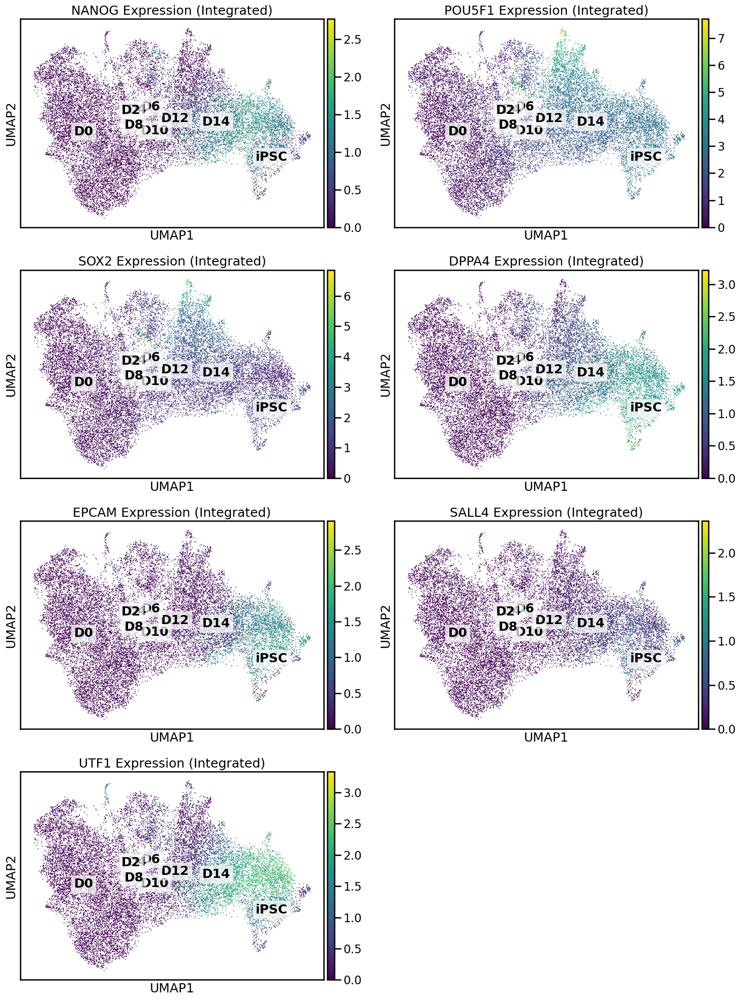


NANOG Expression Summary:
D10: Mean expression = 0.3624
D8: Mean expression = 0.1480
D0: Mean expression = 0.0007
D14: Mean expression = 0.9475
D12: Mean expression = 0.6639
D6: Mean expression = 0.1463
D4: Mean expression = 0.0274
iPSC: Mean expression = 0.7087
D2: Mean expression = 0.0024

POU5F1 Expression Summary:
D10: Mean expression = 1.3145
D8: Mean expression = 1.4421
D0: Mean expression = 0.0007
D14: Mean expression = 2.1255
D12: Mean expression = 1.6428
D6: Mean expression = 1.8768
D4: Mean expression = 1.8248
iPSC: Mean expression = 2.8402
D2: Mean expression = 2.5777

SOX2 Expression Summary:
D10: Mean expression = 0.5715
D8: Mean expression = 0.9394
D0: Mean expression = 0.0002
D14: Mean expression = 0.7025
D12: Mean expression = 0.6203
D6: Mean expression = 1.0503
D4: Mean expression = 1.0719
iPSC: Mean expression = 1.1975
D2: Mean expression = 1.8248

DPPA4 Expression Summary:
D10: Mean expression = 0.4174
D8: Mean expression = 0.2937
D0: Mean expression = 0.0045
D14: M

In [79]:

# Compute UMAP on integrated data
sc.pp.neighbors(query_adata, use_rep="X_scVI")
sc.tl.umap(query_adata)

# Plot UMAP
markers = ['NANOG', 'POU5F1', 'SOX2', 'DPPA4', 'EPCAM', 'SALL4', 'UTF1']

fig, axs = plt.subplots(4, 2, figsize=(15, 20))
axs = axs.flatten()

for i, gene in enumerate(markers):
    if gene in query_adata.var_names:
        sc.pl.umap(query_adata, 
                   color=gene, 
                   title=f'{gene} Expression (Integrated)',
                   ax=axs[i],
                   show=False)
        
        # Add text annotations for each time point
        for time_point in query_adata.obs['sample'].unique():
            subset = query_adata[query_adata.obs['sample'] == time_point]
            centroid = subset.obsm['X_umap'].mean(axis=0)
            axs[i].text(centroid[0], centroid[1], time_point, 
                    fontweight='bold', ha='center', va='center', 
                    bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    else:
        axs[i].text(0.5, 0.5, f"{gene} not found", ha='center', va='center')
        axs[i].axis('off')

# Remove the last empty subplot
fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()

# Print summary statistics for each gene marker
for gene in markers:
    if gene in query_adata.var_names:
        print(f"\n{gene} Expression Summary:")
        for time_point in query_adata.obs['sample'].unique():
            subset = query_adata[query_adata.obs['sample'] == time_point]
            mean_expr = subset[:, gene].X.mean()
            print(f"{time_point}: Mean expression = {mean_expr:.4f}")
    else:
        print(f"\n{gene} not found in the dataset")

In [ ]:
# Save the model

In [77]:
model.save('COMPLETE_INTEGRATION_model_GSE100344_1')

In [101]:
model = scvi.model.SCVI.load('COMPLETE_INTEGRATION_model_GSE100344/', query_adata)

INFO     File COMPLETE_INTEGRATION_model_GSE100344/model.pt already downloaded                                     


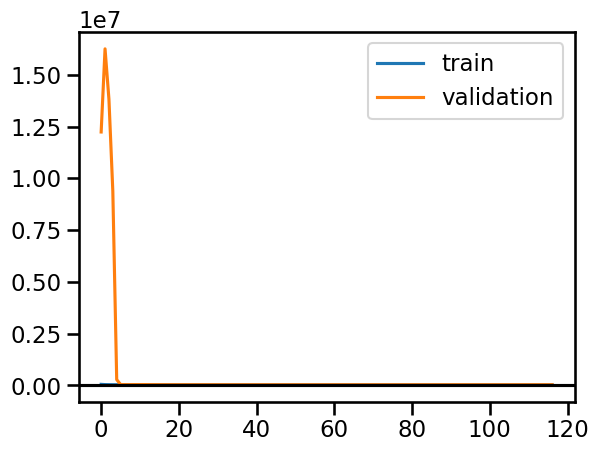

In [92]:
y = model.history['reconstruction_loss_validation']['reconstruction_loss_validation'].min()
plt.plot(model.history['reconstruction_loss_train']['reconstruction_loss_train'], label='train')
plt.plot(model.history['reconstruction_loss_validation']['reconstruction_loss_validation'], label='validation')

plt.axhline(y, c = 'k')

plt.legend()
plt.show()

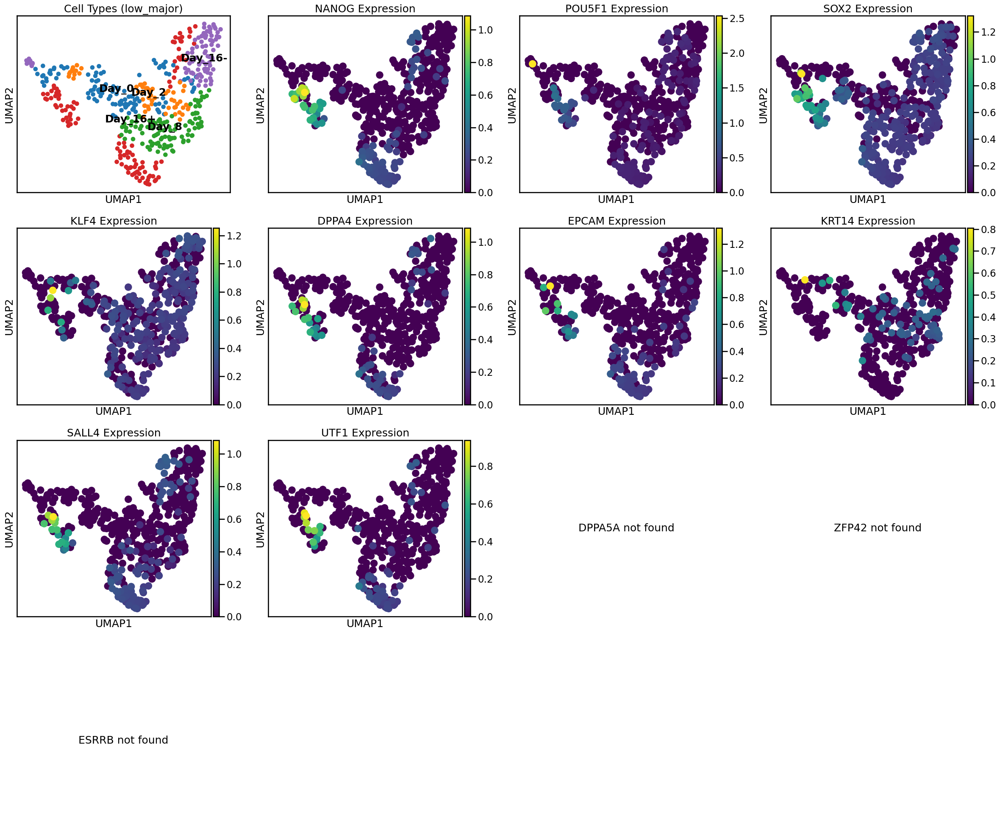


NANOG expression summary:


AttributeError: 'ArrayView' object has no attribute 'summary'

In [105]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

markers = ['NANOG', 'POU5F1', 'SOX2', 'KLF4', 'DPPA4', 'EPCAM', 'KRT14', 'SALL4', 'UTF1', 'DPPA5A', 'ZFP42', 'ESRRB']

# Function to find gene name regardless of case
def find_gene(adata, gene):
    if gene in adata.var_names:
        return gene
    else:
        matches = [g for g in adata.var_names if g.upper() == gene.upper()]
        return matches[0] if matches else None

# Find the correct gene names in the dataset
gene_names = [find_gene(query_adata, gene) for gene in markers]

# Create a figure with subplots
n_rows = 4  # Adjust this if you want a different layout
n_cols = 4
fig, axs = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
axs = axs.flatten()

# Plot the UMAP with low_major coloring
sc.pl.umap(query_adata, color=['low_major'], legend_loc='on data', s=235, ax=axs[0], show=False, title='Cell Types (low_major)')

# Plot UMAPs for each gene
for i, gene in enumerate(gene_names, start=1):
    if gene:
        sc.pl.umap(query_adata, color=gene, s=635, ax=axs[i], show=False, title=f'{gene} Expression')
    else:
        axs[i].text(0.5, 0.5, f"{markers[i-1]} not found", ha='center', va='center')
        axs[i].axis('off')

# Remove any extra empty subplots
for i in range(len(gene_names)+1, len(axs)):
    fig.delaxes(axs[i])

plt.tight_layout()
plt.show()

# Print statistics for each gene
for orig_name, gene in zip(markers, gene_names):
    if gene:
        print(f"\n{gene} expression summary:")
        print(query_adata[:, gene].X.summary())
        
        print(f"\nMean {gene} expression by cell type:")
        print(query_adata.obs.groupby('low_major')[gene].mean().sort_values(ascending=False))
    else:
        print(f"\n{orig_name} not found in the dataset.")

# Calculate correlations between genes
valid_genes = [gene for gene in gene_names if gene is not None]
if len(valid_genes) > 1:
    print("\nCorrelations between genes:")
    gene_expr = query_adata[:, valid_genes].X.toarray()
    corr_matrix = np.corrcoef(gene_expr.T)
    for i, gene1 in enumerate(valid_genes):
        for j, gene2 in enumerate(valid_genes):
            if i < j:
                print(f"{gene1} vs {gene2}: {corr_matrix[i, j]:.3f}")

# Optional: Heatmap of gene correlations
if len(valid_genes) > 1:
    plt.figure(figsize=(10, 8))
    plt.imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)
    plt.colorbar()
    plt.xticks(range(len(valid_genes)), valid_genes, rotation=90)
    plt.yticks(range(len(valid_genes)), valid_genes)
    plt.title("Gene Expression Correlations")
    for i in range(len(valid_genes)):
        for j in range(len(valid_genes)):
            plt.text(j, i, f"{corr_matrix[i, j]:.2f}", 
                     ha="center", va="center", color="black")
    plt.tight_layout()
    plt.show()

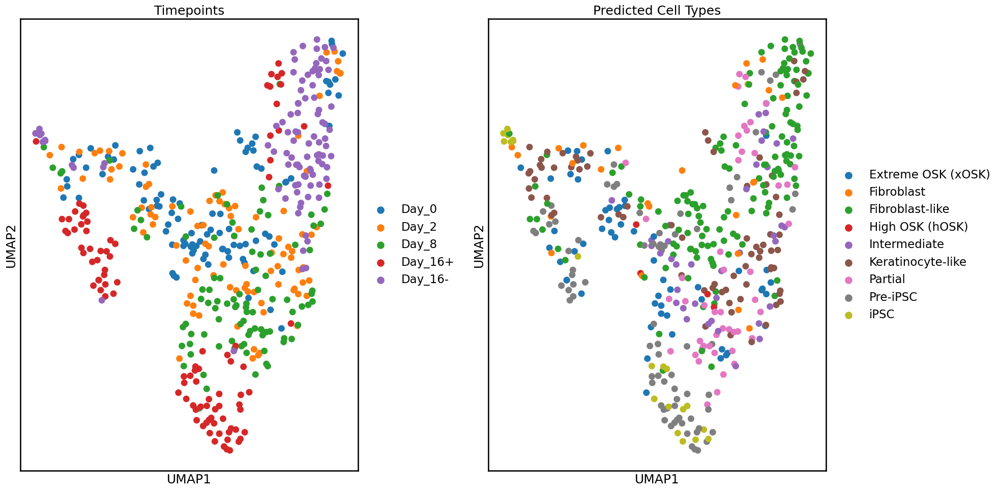

In [107]:
import scanpy as sc
import matplotlib.pyplot as plt

# Use the scVI latent representation for UMAP
sc.pp.neighbors(query_adata, use_rep="X_scVI")
sc.tl.umap(query_adata)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# 1. UMAP plot of timepoints
sc.pl.umap(query_adata, color='batch', title='Timepoints', ax=ax1, show=False, s = 350)

# 2. UMAP plot of predicted cell types
sc.pl.umap(query_adata, color='predicted', title='Predicted Cell Types', ax=ax2, show=False, s = 350)

plt.tight_layout()
plt.show()

In [82]:
query_adata.obs

,celltype,batch,sample,_scvi_batch,_scvi_labels,predicted,transfer_score,predicted_labels,total_counts,n_genes_by_counts,log1p_total_counts,log1p_n_genes_by_counts,pct_counts_in_top_100_genes,overcluster
SRR5739552,Unknown,Day_0,SRR5739552,0,0,Fibroblast-like,0.999984,Fibroblast-like,144248,6028,11.879296,8.704336,29.721036,12
SRR5739553,Unknown,Day_0,SRR5739553,0,0,Intermediate,0.853787,Fibroblast-like,1493321,6373,14.216514,8.759982,29.384841,6
SRR5739554,Unknown,Day_0,SRR5739554,0,0,Fibroblast,0.999741,Fibroblast-like,1058894,6636,13.872736,8.800415,21.903231,20
SRR5739555,Unknown,Day_0,SRR5739555,0,0,Fibroblast-like,0.999232,Fibroblast,2390197,6529,14.686887,8.784162,28.354567,3
SRR5739556,Unknown,Day_0,SRR5739556,0,0,Intermediate,0.953666,Fibroblast-like,1499972,5602,14.220958,8.631057,32.650543,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR5740027,Unknown,Day_16-,SRR5740027,0,0,Keratinocyte-like,0.999999,Fibroblast-like,331783,7511,12.712239,8.924257,20.403396,2
SRR5740028,Unknown,Day_16-,SRR5740028,0,0,Pre-iPSC,0.973565,iPSC,177227,4535,12.085192,8.419801,21.918782,1
SRR5740029,Unknown,Day_16-,SRR5740029,0,0,Fibroblast-like,0.991614,Fibroblast-like,165428,5061,12.016297,8.529517,23.454312,12
SRR5740030,Unknown,Day_16-,SRR5740030,0,0,Keratinocyte-like,0.999614,Fibroblast-like,12526,637,9.435642,6.458338,16.741178,9


/tmp/ipykernel_41406/2711880518.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  query_adata.obs['low_major'] = query_adata.obs.groupby('overcluster')['predicted_labels'].transform(lambda x: x.mode()[0])
... storing 'low_major' as categorical


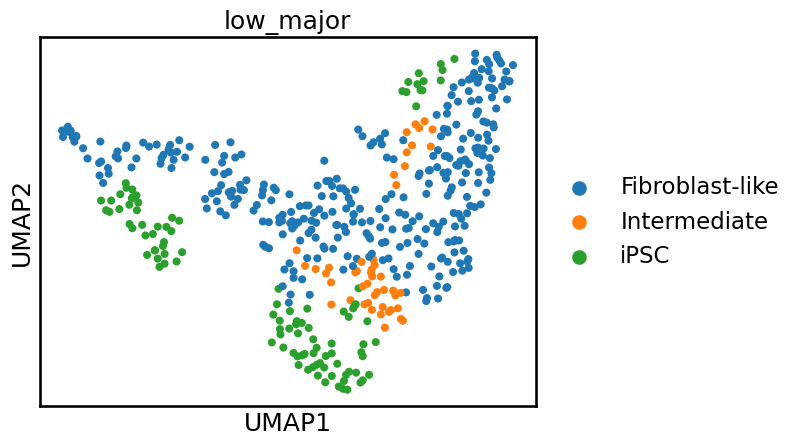

In [109]:
query_adata.obsm['X_scVI'] = model.get_latent_representation()
sc.pp.neighbors(query_adata, use_rep = 'X_scVI')
sc.tl.leiden(query_adata, resolution = 6, key_added = 'overcluster')
sc.tl.umap(query_adata)
sc.pp.normalize_total(query_adata)
sc.pp.log1p(query_adata)

query_adata.obs['low_major'] = query_adata.obs.groupby('overcluster')['predicted_labels'].transform(lambda x: x.mode()[0])
sc.pl.umap(query_adata, color = ['low_major'], s = 135)

/tmp/ipykernel_41406/298955459.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  query_adata.obs['low_major'] = query_adata.obs.groupby('overcluster')['predicted_labels'].transform(lambda x: x.mode()[0])
... storing 'low_major' as categorical


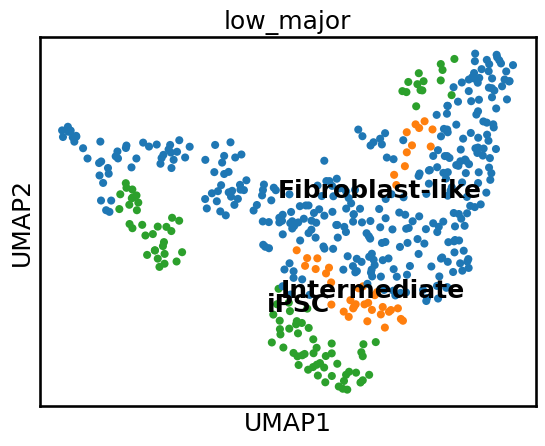

In [277]:
query_adata.obsm['X_scVI'] = model.get_latent_representation()
sc.pp.neighbors(query_adata, use_rep = 'X_scVI')
sc.tl.leiden(query_adata, resolution = 4, key_added = 'overcluster')
sc.tl.umap(query_adata)
sc.pp.normalize_total(query_adata)
sc.pp.log1p(query_adata)

query_adata.obs['low_major'] = query_adata.obs.groupby('overcluster')['predicted_labels'].transform(lambda x: x.mode()[0])
sc.pl.umap(query_adata, color = ['low_major'], legend_loc = 'on data', s = 135)

/tmp/ipykernel_41406/2783823292.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  query_adata.obs['low_major'] = query_adata.obs.groupby('overcluster')['batch'].transform(lambda x: x.mode()[0])
... storing 'low_major' as categorical


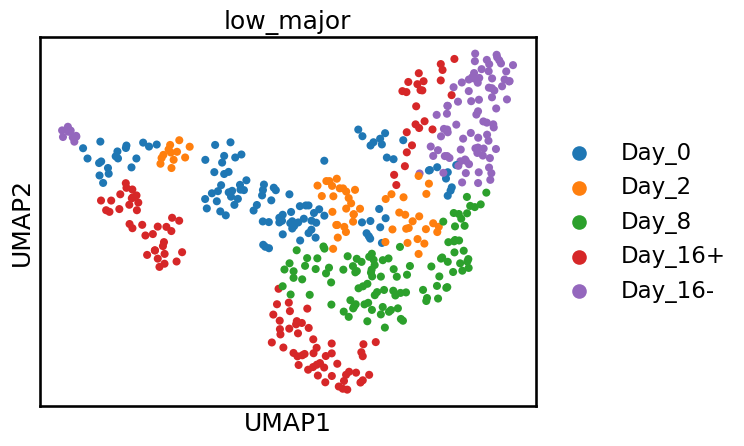

In [429]:
query_adata.obsm['X_scVI'] = model.get_latent_representation()
sc.pp.neighbors(query_adata, use_rep = 'X_scVI')
sc.tl.leiden(query_adata, resolution = 3, key_added = 'overcluster')
sc.tl.umap(query_adata)
#sc.pp.normalize_total(query_adata)
#sc.pp.log1p(query_adata)

query_adata.obs['low_major'] = query_adata.obs.groupby('overcluster')['batch'].transform(lambda x: x.mode()[0])
sc.pl.umap(query_adata, color = ['low_major'] , s = 135)

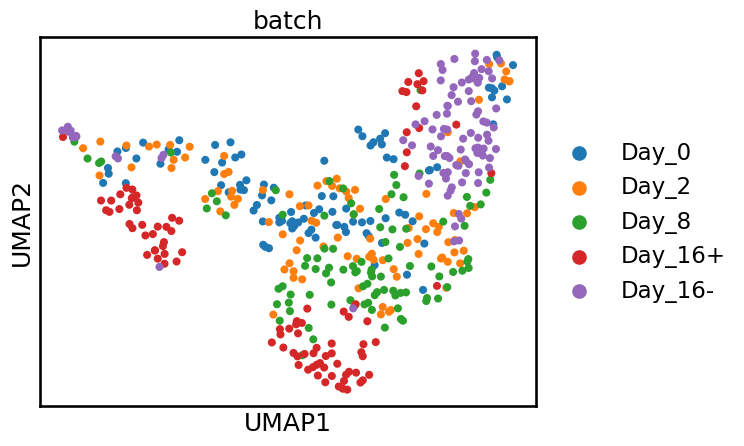

In [268]:
sc.pl.umap(query_adata, color = ['batch'] , s = 135)

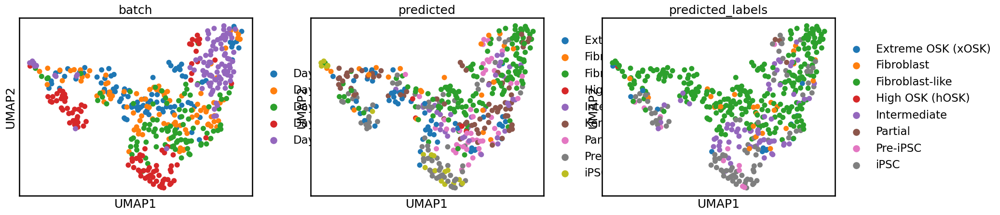

In [114]:
sc.pl.umap(query_adata, color = ['batch', 'predicted', 'predicted_labels' ])


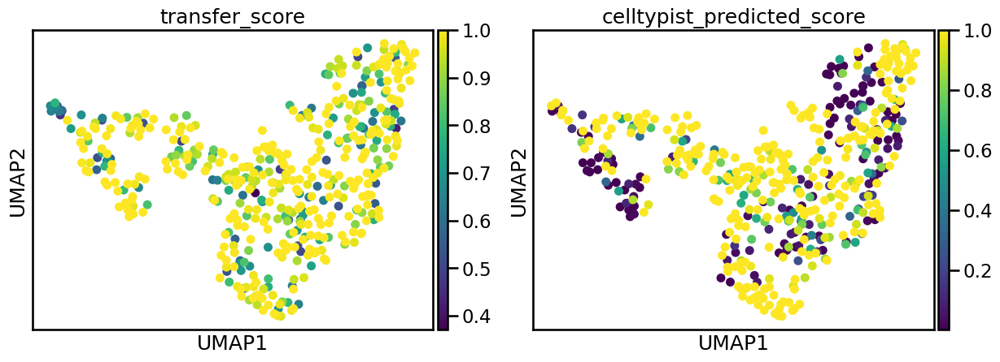

In [134]:
sc.pl.umap(query_adata, color = ['transfer_score', 'celltypist_predicted_score' ])


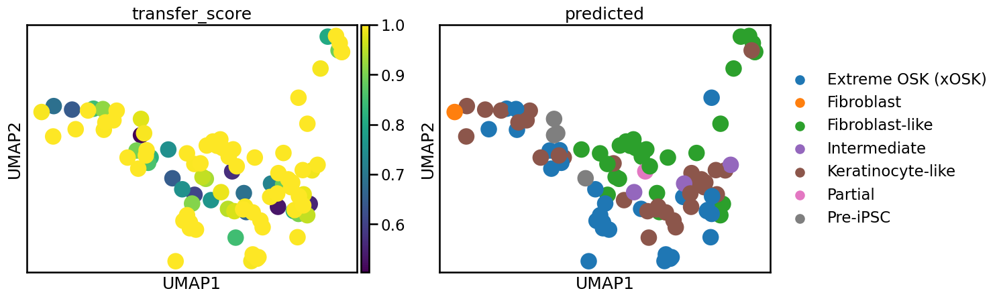

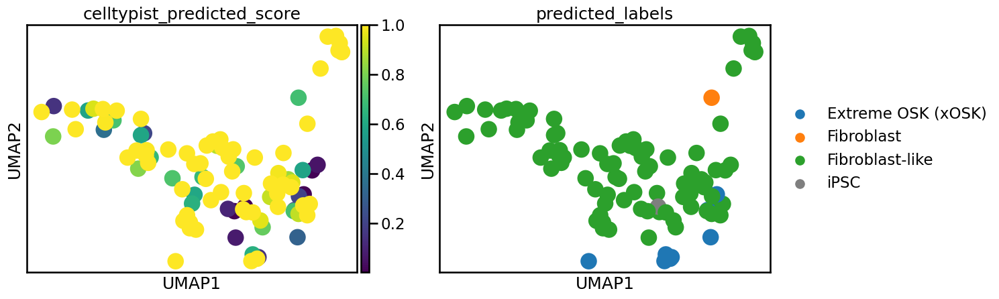

In [510]:
# Filter the data to include only observations where batch is 'day_0'
day_0_adata = query_adata[query_adata.obs['batch'] == 'Day_0']
day_2_adata = query_adata[query_adata.obs['batch'] == 'Day_2']
day_8_adata = query_adata[query_adata.obs['batch'] == 'Day_8']
day_16_adata = query_adata[query_adata.obs['batch'] == 'Day_16+']

# Generate the UMAP plot
sc.pl.umap(day_2_adata, color=['transfer_score','predicted'])
sc.pl.umap(day_2_adata, color=['celltypist_predicted_score','predicted_labels'])

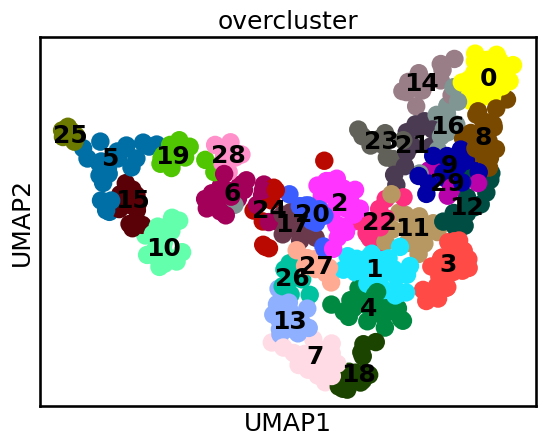

In [278]:
sc.pl.umap(query_adata, color = ['overcluster'], legend_loc = 'on data', s = 705)

In [430]:
reprogrammed_cell_markers = ['NANOG', 'POU5F1', 'SOX2', 'KLF4', 'DPPA4', 'EPCAM', 'KRT14', 'SALL4', 'UTF1', 'DPPA5A', 'ZFP42', 'ESRRB']

sc.tl.score_genes(query_adata, reprogrammed_cell_markers, score_name = 'REPROGRAMMING_score')

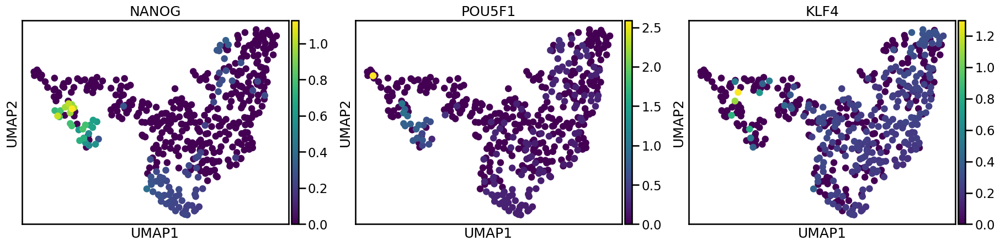

In [431]:
sc.pl.umap(query_adata, color = ['NANOG', 'POU5F1', 'KLF4'], s = 325)


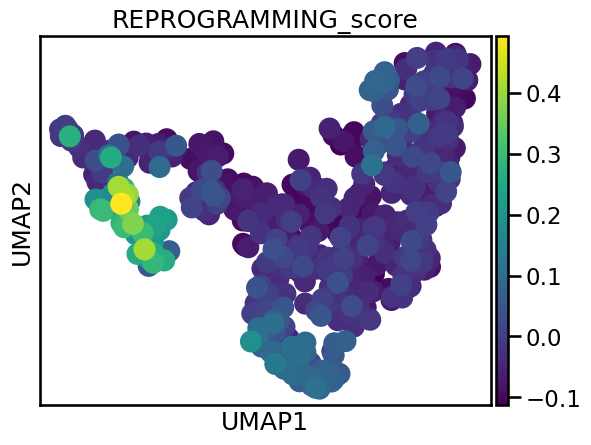

In [432]:
sc.pl.umap(query_adata, color = ['REPROGRAMMING_score'], s = 1005)

/tmp/ipykernel_41406/2646932584.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  REPROGRAMMING_score = query_adata.obs[['overcluster', 'REPROGRAMMING_score']].groupby('overcluster').median()
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


<Axes: xlabel='overcluster', ylabel='REPROGRAMMING_score'>

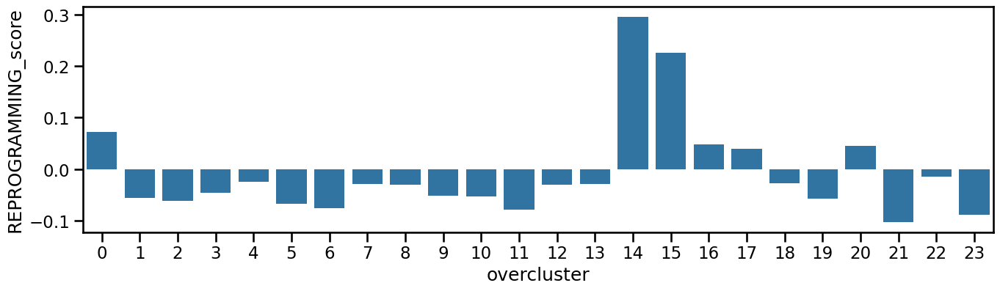

In [433]:
REPROGRAMMING_score = query_adata.obs[['overcluster', 'REPROGRAMMING_score']].groupby('overcluster').median()
plt.figure(figsize = (16, 4))
sns.barplot(REPROGRAMMING_score, y = 'REPROGRAMMING_score', x = REPROGRAMMING_score.index)

In [434]:
sc.tl.rank_genes_groups(query_adata, groupby = 'overcluster')
marks = sc.get.rank_genes_groups_df(query_adata, group = None)

/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:440: Perform

In [174]:
marks


,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,PARD6B,25.663172,2.336528,1.002780e-66,5.879632e-63
1,0,ADD2,21.539978,1.986405,2.963710e-67,2.606583e-63
2,0,Unknown.1081,21.320917,3.430405,1.447109e-28,3.104226e-26
3,0,VASH2,20.502556,2.177754,2.424913e-64,1.066355e-60
4,0,CXADR,19.956198,1.836846,7.908199e-62,2.782105e-58
...,...,...,...,...,...,...
422155,23,OSTM1,-19.056871,-26.189816,1.933125e-60,6.800734e-57
422156,23,TSFM,-19.105040,-26.155968,1.149516e-60,5.054998e-57
422157,23,RMND5A,-19.451887,-26.465342,2.710412e-62,1.589205e-58
422158,23,RPL23AP74,-20.379200,-26.343348,1.171032e-66,1.029922e-62


/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


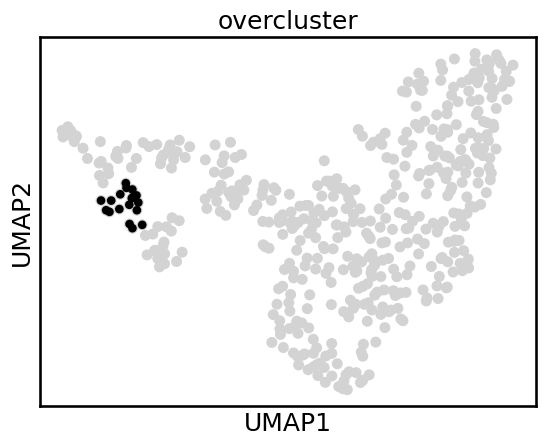

In [293]:
ax = sc.pl.umap(query_adata, palette = 'lightgrey', show = False)
sc.pl.umap(query_adata[query_adata.obs.overcluster == '5'], color = 'overcluster', ax = ax, legend_loc = None, palette = 'k', s=155)


In [505]:
_ = query_adata.obs.groupby(['overcluster', 'batch']).size().reset_index()
_[_.overcluster == '12']

/tmp/ipykernel_41406/2815159371.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  _ = query_adata.obs.groupby(['overcluster', 'batch']).size().reset_index()


,overcluster,batch,0
60,12,Day_0,0
61,12,Day_2,1
62,12,Day_8,1
63,12,Day_16+,1
64,12,Day_16-,16


# Explore top gene markers per cluster based on log fold changes

In [440]:
marks[(marks.group == '13') ].sort_values('logfoldchanges', ascending = False).head(20)


,group,names,scores,logfoldchanges,pvals,pvals_adj
229185,13,RPL17P9,1.313569,4.892116,0.205481,0.291344
229470,13,Unknown.137,0.932002,3.932016,0.363657,0.477546
229163,13,DPEP1,1.348580,3.895891,0.194161,0.277261
229477,13,PCBP2-OT1,0.926115,3.816607,0.366626,0.480655
229480,13,ITGA10,0.920026,3.691438,0.369710,0.484085
229485,13,RPL21P2,0.914935,3.605385,0.372306,0.486847
229487,13,CLDN5,0.914650,3.598754,0.372444,0.486976
229490,13,ALDH1A3-AS1,0.911402,3.541869,0.374112,0.488757
229492,13,MROH8,0.909379,3.510724,0.375147,0.489891
229495,13,CLDN23,0.906623,3.466956,0.376565,0.491487


In [201]:
marks[(marks.names == 'LINC00678') ].sort_values('logfoldchanges', ascending = False).head(20)


,group,names,scores,logfoldchanges,pvals,pvals_adj
264281,15,LINC00678,3.108702,2.902425,6.329264e-03,1.455127e-02
14,0,LINC00678,16.067030,2.853417,1.404418e-22,1.524920e-20
281593,16,LINC00678,4.076240,2.282360,8.019778e-04,4.908417e-03
247722,14,LINC00678,0.875470,1.366537,3.934055e-01,5.250729e-01
356277,20,LINC00678,0.753751,0.728252,4.694088e-01,7.534355e-01
149758,8,LINC00678,0.183978,0.118449,8.554555e-01,9.478716e-01
132945,7,LINC00678,0.180919,0.106837,8.577228e-01,9.357325e-01
307526,17,LINC00678,-0.084373,-0.083347,9.339514e-01,9.717770e-01
328453,18,LINC00678,-1.015852,-1.046401,3.289276e-01,6.314237e-01
49058,2,LINC00678,-2.813267,-2.080773,6.908433e-03,2.596012e-02


In [501]:
fibroblast_markers = ['VIM', 'DCN', 'PDGFRA', 'ACTA2', 'PDGFRB', 'COL6A2']

sc.tl.score_genes(query_adata, fibroblast_markers, score_name = 'fibroblast_markers')

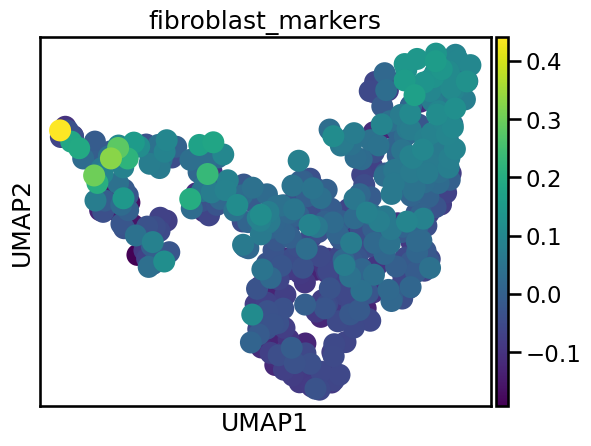

In [502]:
sc.pl.umap(query_adata, color = ['fibroblast_markers'], s = 1005)

/tmp/ipykernel_41406/2976335976.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fibroblast_markers = query_adata.obs[['overcluster', 'fibroblast_markers']].groupby('overcluster').median()
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


<Axes: xlabel='overcluster', ylabel='fibroblast_markers'>

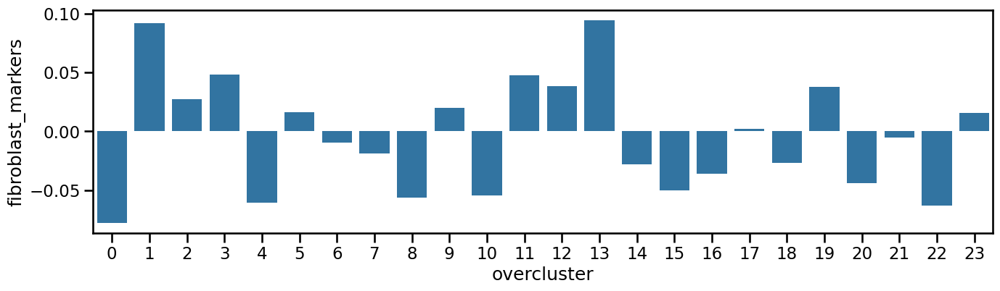

In [503]:
fibroblast_markers = query_adata.obs[['overcluster', 'fibroblast_markers']].groupby('overcluster').median()
plt.figure(figsize = (16, 4))
sns.barplot(fibroblast_markers, y = 'fibroblast_markers', x = fibroblast_markers.index)

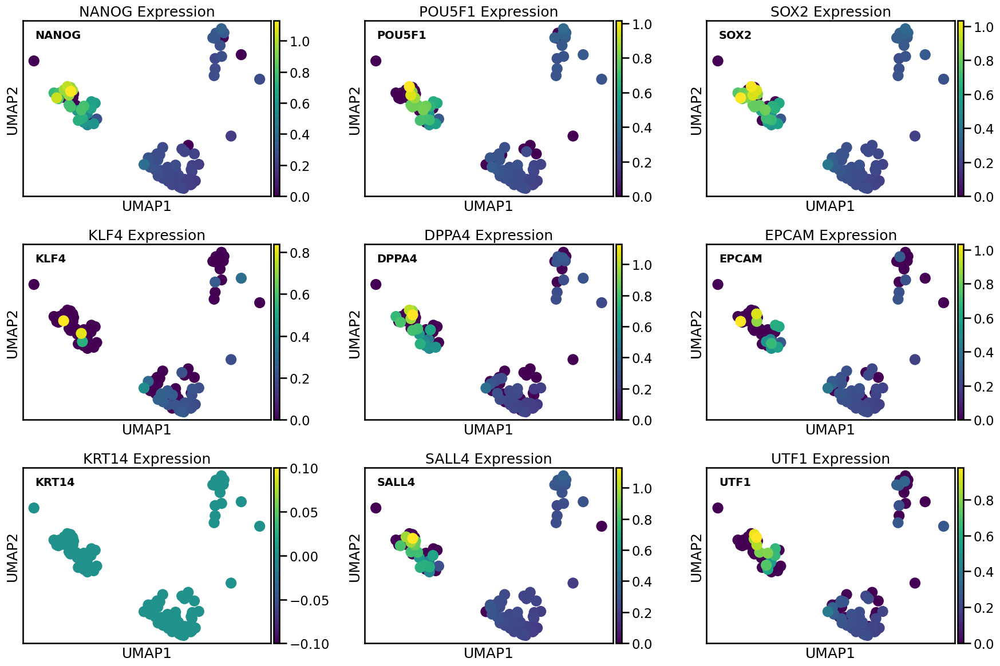

<Figure size 1000x800 with 0 Axes>

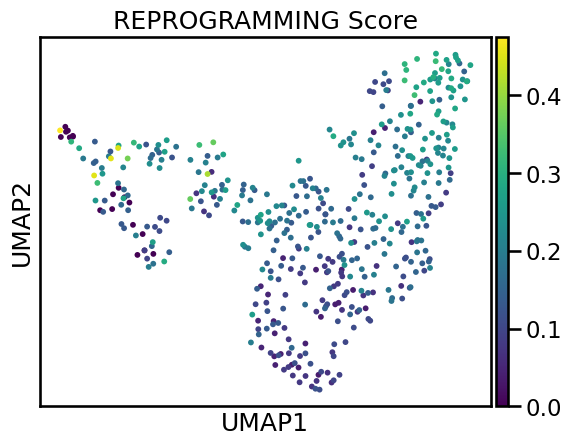

<Figure size 640x480 with 0 Axes>

In [520]:
import scanpy as sc
import matplotlib.pyplot as plt

reprogrammed_cell_markers = ['NANOG', 'POU5F1', 'SOX2', 'KLF4', 'DPPA4', 'EPCAM', 'KRT14', 'SALL4', 'UTF1']

# Create a figure with subplots for each marker
fig, axs = plt.subplots(3, 3, figsize=(18, 12))
axs = axs.flatten()

# Plot UMAP for each fibroblast marker
for i, marker in enumerate(reprogrammed_cell_markers):
    sc.pl.umap(day_16_adata, 
               color=marker, 
               title=f'{marker} Expression',
               ax=axs[i], 
               show=False, 
               s=770,  # Adjust point size as needed
               cmap='viridis',  # You can change the colormap if desired
               colorbar_loc='right')
    
    # Add gene name as text on the plot
    axs[i].text(0.05, 0.95, marker, transform=axs[i].transAxes, 
                fontsize=14, fontweight='bold', 
                verticalalignment='top', horizontalalignment='left')

plt.tight_layout()
plt.show()

# Optional: Save the figure
# plt.savefig('fibroblast_markers_umap.png', dpi=300, bbox_inches='tight')

# Create an additional plot showing overall fibroblast score
# Calculate the average expression of fibroblast markers
query_adata.obs['REPROGRAMMING_score'] = query_adata[:, fibroblast_markers].X.mean(axis=1)

plt.figure(figsize=(10, 8))
sc.pl.umap(query_adata, 
           color='REPROGRAMMING_score', 
           title='REPROGRAMMING Score',
           s=70,
           cmap='viridis',
           colorbar_loc='right')

plt.tight_layout()
plt.show()

# Optional: Save the fibroblast score figure
# plt.savefig('fibroblast_score_umap.png', dpi=300, bbox_inches='tight')

/home/ubuntu/miniconda3/envs/scgpt/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


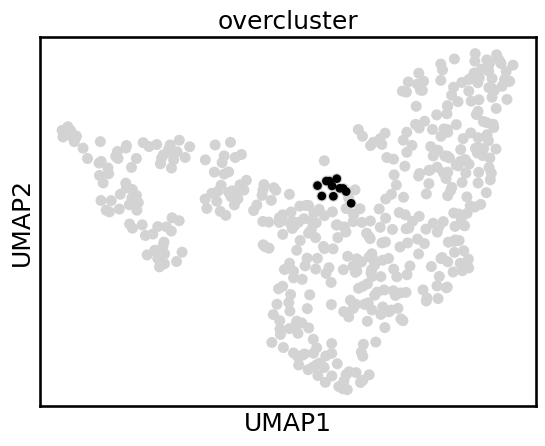

In [353]:
ax = sc.pl.umap(query_adata, palette = 'lightgrey', show = False)
sc.pl.umap(query_adata[query_adata.obs.overcluster == '22'], color = 'overcluster', ax = ax, legend_loc = None, palette = 'k', s=155)

In [366]:
_ = query_adata.obs.groupby(['overcluster', 'batch']).size().reset_index()
_[_.overcluster == '32']

/tmp/ipykernel_41406/310996751.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  _ = query_adata.obs.groupby(['overcluster', 'batch']).size().reset_index()


,overcluster,batch,0
160,32,Day_0,0
161,32,Day_2,0
162,32,Day_8,1
163,32,Day_16+,1
164,32,Day_16-,7


In [15]:

# 3. Confusion matrix
conf_matrix = pd.crosstab(val_adata.obs['celltype'], val_adata.obs['predicted_celltype'])
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Cell Type')
plt.ylabel('True Cell Type')
plt.show()


NameError: name 'val_adata' is not defined

In [ ]:

# 4. Bar plot of cell type proportions
true_proportions = val_adata.obs['celltype'].value_counts(normalize=True)
predicted_proportions = val_adata.obs['predicted_celltype'].value_counts(normalize=True)

plt.figure(figsize=(12, 6))
true_proportions.plot(kind='bar', position=0, width=0.4, alpha=0.8, label='True')
predicted_proportions.plot(kind='bar', position=1, width=0.4, alpha=0.8, label='Predicted')
plt.title('Cell Type Proportions: True vs Predicted')
plt.xlabel('Cell Type')
plt.ylabel('Proportion')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [ ]:

# 6. Metrics visualization
metrics = ['ARI', 'Accuracy', 'NMI']
scores = [ari, accuracy, nmi]

plt.figure(figsize=(10, 6))
sns.barplot(x=metrics, y=scores)
plt.title('Evaluation Metrics')
plt.ylim(0, 1)
for i, score in enumerate(scores):
    plt.text(i, score, f'{score:.4f}', ha='center', va='bottom')
plt.show()